# Quiz 4 - Visão Computacional

## Felipe Bartelt de Assis Pessoa - 2016026841
***

Primeiramente, implementou-se a função `blending`. Essa função faz o *blending* de duas imagens, assim recebe 2 parâmetros  obrigatórios: `img1, img2`, que são justamente as imagens(BGR) que devem ser *blended*, ainda recebe um parâmetro opcional `blend_type` que define o tipo de *blending* a ser utilizado, podendo ser 'average' ou 'feathering', caso não fornecido, esse parâmetro é tomado como 'average' e, caso seja especificado um tipo diferente, um erro é gerado. A função retorna `blended`, a imagem final (BGR) após o *blending*.

A função tem como primeiro passo conferir se `img1` é um escalar, isso nada mais é que um *workaround* para forçar o funcionamento da função `wapImages_multi`, que será explicada futuramente. Caso `img1` seja um escalar, retorna-se `img2`.

A seguir, faz-se as cópias das imagens fornecidas e toma-se `blended` como a soma de ambas, dada pela função `cv2.addWeighted`, com pesos unitários e deslocamento nulo. Utilizou-se essa função, pois é mais rápida que a soma feita pelo NumPy, segundo à documentação da OpenCV. 

Após são criadas matrizes auxiliares para checagem de *overlap*. Da forma como foi implementada a função `warpImages_multi`, é possível checar se duas imagens se interceptam tomando-se os índices onde seus pixels tem cores BGR não nulas. Assim, as matrizes `img1_iscolor, img2_iscolor` são matrizes binárias que representam se há uma cor não preta em cada pixel, essas matrizes são somadas e armazenadas em `overlap` de forma que, um valor igual a $2$ num elemento de `overlap` indica o pixel onde ocorre sobreposição das imagens. Com auxílio da função `np.nonzero`, econtra-se os índices de `overlap` onde tem-se valor $2$. Uma vez que os índices retornados são em 3 dimensões e só se tem interesse nas duas primeiras, encontra-se os índices (linha, coluna) únicos por meio da composição de funções `set, zip`, ao final, tem-se uma tupla de índices que permite a indexação de ndarrays, armazenados em `idxs`.

A seguir, checa-se se o `blend_type` é 'feathering'. Caso seja, toma-se, tanto para `img1` quanto para `img2`, o seguinte processo, explicado com base em `img1` : copia-se `img1` para `i1` e converte-se a imagem para escala de cinza; aplica-se a função `distanceTransform` sobre a imagem em *grayscale*, utilizando a métrica do máximo e armazena-se o resultado em `i1_dist`; normaliza-se o resultado `i1_dist`, com base no mínimo e máximo, de forma a se obter valores no intervalo $[0,1]$, esse resultado representa os pesos de cada pixel com base na sua distância até a borda da imagem e é armazenado em `i1_weight`; por fim, toma-se a multiplicação *element-wise* de `i1` com `i1_weight`. Uma vez tendo-se tanto `i1_weight` quanto `i2_weight`, pode-se dividir as imagens ponderadas obtidas pela soma desses pesos, fazendo `i1_weighted = i1_weighted / (i1_weight + i2_weight)`, sendo o processo análogo para `i2_weighted`. Finalmente, utiliza-se a função `cv2.addWeighted` para somar, utilizando pesos unitários e deslocamento nulo, somente os elementos de `i1_weighted` e `i2_weighted` que estão nos índices dados por `idxs`, ou seja, soma-se somente os pixels sobrepostos, essa soma é armazenada em `aux`. Por último, altera-se os elementos de `blended` nos índices dados por `idxs` para os valores dados por `aux`, assim retornando a imagem final `blended`.

Caso o `blend_type` seja 'average', copia-se para `i1_overlap` e `i2_overlap` os valores de `img1` e `img2`, respectivamente, nos índices dados por `idxs`. Assim, utilizando a função `addWeighted`, soma-se `i1_overlap` e `i2_overlap`, ambos com pesos $0.5$, com deslocamento $0$, sendo o resultado armazenado em `aux`. Altera-se então os valores de `blended` nos índices dados por `idxs` para ser iguais à `aux`, retornando-se ao fim a imagem final `blended`.

Caso `blend_type` não seja nem 'feathering' nem 'average', um erro é gerado indicando que o `blend_type` especificado não existe.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [2]:
def blending(img1, img2, blend_type = 'average'):
    """ Blends two images together using one of two blending types:
            'average' or 'feathering'
    If blend_type is not specified, 'average' is used

    Parameters
    ----------
    img1 : Image (BGR)
        First image to be blended
    img2: Image (BGR)
        Second image to be blended            
    blend_type: string, optional
        Type of blending to use:
            'average' - Straight averaging of overlapping pixels sum
            'feathering' - Weighed average of overlapping pixels sum
                The weights are based on the chebyshev distance of each
                pixel to the image borders.
    Returns
    -------
    blended: Image (BGR)
        The resulting image after blending

    Raises
    ------
    ValueError
        If blend_type is not 'average' or 'feathering'
    """

    if np.isscalar(img1):
        # Workaround that lets warpImages_multi work properly
        return img2
    
    # sums both images
    img1 = img1.copy()
    img2 = img2.copy()
    blended = cv2.addWeighted(img1, 1.0, img2, 1.0, 0.0)
    
    # find where two images overlap and get overlapping indices
    img1_iscolor = img1.copy()
    img1_iscolor = 1*(img1_iscolor != 0)
    img2_iscolor = img2.copy()
    img2_iscolor = 1*(img2_iscolor != 0)
    
    overlap = img1_iscolor + img2_iscolor
    
    idxs = np.nonzero(overlap == 2)
    idxs = tuple(zip(*set(zip(*idxs[:-1]))))

    if blend_type == 'feathering':
        # changes overlapping pixels to the weighted average of their sums
        i1 = img1.copy()
        i1_gray = cv2.cvtColor(i1, cv2.COLOR_BGR2GRAY)
        i1_dist = cv2.distanceTransform(i1_gray, cv2.DIST_C, 3)
        i1_dist = cv2.normalize(i1_dist,i1_dist,0,1,cv2.NORM_MINMAX)
        i1_weight = i1_dist.reshape(i1_dist.shape[0], i1_dist.shape[1], 1)
        i1_weighted = (i1_weight * i1)

        i2 = img2.copy()
        i2_gray = cv2.cvtColor(i2, cv2.COLOR_BGR2GRAY)
        i2_dist = cv2.distanceTransform(i2_gray, cv2.DIST_C, 3)
        i2_dist = cv2.normalize(i2_dist,i2_dist,0,1,cv2.NORM_MINMAX)
        i2_weight = i2_dist.reshape(i2_dist.shape[0], i2_dist.shape[1], 1)
        i2_weighted = ((i2_weight * i2) / (i1_weight + i2_weight)).astype(np.uint8)
        
        i1_weighted = (i1_weighted / (i1_weight + i2_weight)).astype(np.uint8)

        aux = cv2.addWeighted(i1_weighted[idxs], 1.0, i2_weighted[idxs], 1.0, 0.0)
        blended[idxs] = aux

    elif blend_type == 'average':
        # changes overlapping pixels to the average of their sums
        i1_overlap = img1[idxs].copy()
        i2_overlap = img2[idxs].copy()
        aux = cv2.addWeighted(i1_overlap, 0.5, i2_overlap, 0.5, 0.0)
        blended[idxs] = aux

    else:
        raise ValueError('blend_type ', blend_type, ' not defined')

    return blended



A segunda função implementada foi a `warpImages_multi` e é utilizada para gerar a foto panorâmica final, realizando *warps* e *blendings*. Essa função é uma adaptação da função encontrada em http://datahacker.rs/005-how-to-create-a-panorama-image-using-opencv-with-python/ , permitindo o uso de diversas imagens para *mosaicing*.

Essa função recebe como parâmetros a imagem(BGR) de destino `dst_img`; uma tupla contendo todas as imagens(BGR) que devem ser modificadas de forma a se obter a panorâmica final `src_imgs`; uma tupla de matrizes `H`, que contém todas as matrizes de homografia, em ordem, das imagens em `src_imgs`, tendo sido obtidas com base na imagem `dst_img`; e o parâmetro `blend_type`, que especifica o tipo de *blending* a ser utilizado.

O primeiro passo executado pela função é a extração das coordenadas que limitam a imagem de destino `dst_img`, esses quatro pontos de limite serão utilizados para a projeção das imagens e são armazenados em `list_dst_pts`, que é copiado para `list_pts`. Em seguida, realiza-se o mesmo processo para cada imagem pertencente à `src_imgs`, porém essas coordenadas, `temp_points`, sofrem a operação de transformação perspectiva com base em sua respectiva matriz de homografia, gerando assim as coordenadas limites da imagem projetada `list_src_pts`, a cada iteração, concatena-se a matriz `list_src_pts` obtida com a matriz `list_pts`, de forma que, após o término da iteração de todas as imagens de `src_imgs`, encontra-se os valores mínimos $[x_{min}, y_{min}]$, decrescidos de uma margem $0.5$, e os valores máximos $[x_{max}, y_{max}]$, acrescidos de uma margem de $0.5$, da matriz final `list_pts`, obtendo-se assim as coordenadas limite da imagem final. Com base nessas coordenadas, é posśivel obter uma matriz `H_translation` que indica em quais coordenadas a imagem deve ser projetada, ou seja, a posição, na imagem final, para cada imagem.

Inicializa-se `output_img` como $0$. Assim, itera-se novamente cada imagem de `src_imgs` e realiza-se o *warp* perspectivo para cada uma delas com base na matriz de homografia resultante do produto entre `H_translation` e a respectiva `H` fornecida como parâmetro da função, armazenando-se essa projeção em `warped`. A seguir, essa imagem `warped` passa pela função `blending`, com tipo de *blending* definido por `blend_type`, para que seja feito o blending entre ela e `output_img`, o resultado do *blending* é então alocado em `output_img`, dessa forma, unindo todas as projeções feitas em uma imagem final, já passando por um *blending*.

Após se adicionar todas as imagens projetadas à `output_img`, copia-se essa matriz para uma nova `output_aux` e multiplica-se por 0, de forma a se obter uma imagem preta de mesmo tamanho que `output_img`. Acrescenta-se finalmente a imagem base `dst_img` à `output_aux` nas coordenadas corretas para o "encaixe" de todas as imagens. Então, como passo final, realiza-se o *blending* entre `output_aux` e `output_img`, com base no tipo especificado por `blend_type`, esse resultado é armazenado em `output_img`, que é então retornada ao usuário.

In [3]:
def warpImages_multi(dst_img, src_imgs, H, blend_type = 'average'):
    """ Creates a mosaic by warping each image in src_imgs into the 
    destination image dst_img, blending every image together.
    If blend_type is not specified, 'average' is used.

    Parameters
    ----------
    dst_img : Image (BGR)
        Destination image for warping
    src_imgs: tuple of Images(BGR)
        A tuple that contains every image that must be warped into 
        final mosaic
    H: tuple of ndarrays
        A tuple that contains the respective homography matrix for
        each image in src_imgs, based on dst_img
    blend_type: string, optional
        Type of blending to use when warping:
            'average' - Straight averaging of overlapping pixels sum
            'feathering' - Weighed average of overlapping pixels sum
                The weights are based on the chebyshev distance of each
                pixel to the image borders.
    Returns
    -------
    output_img: Image (BGR)
        The resulting image after mosaicing
    """
    # get coordinates of destination image
    rows1, cols1 = dst_img.shape[:2]
    list_dst_pts = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
    list_pts = list_dst_pts.copy()
    
    for idx, src in enumerate(src_imgs):
        # iterate every image in src_image and get its coordinates for projection
        rows2, cols2 = src.shape[:2]
        temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)
        list_src_pts = cv2.perspectiveTransform(temp_points, H[idx])
        list_pts = np.concatenate((list_pts, list_src_pts), axis=0)
    
    # gets the size limits of final mosaic
    [x_min, y_min] = np.int32(list_pts.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(list_pts.max(axis=0).ravel() + 0.5)
  
    translation_dist = [-x_min,-y_min]
  
    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
    output_img =0

    for idx, src in enumerate(src_imgs):
        # warps every image in src_imgs into the final mosaic
        warped = cv2.warpPerspective(src, H_translation.dot(H[idx]), (x_max-x_min, y_max-y_min))
        output_img = blending(output_img, warped, blend_type)
    
    # adds dst_img to the final mosaic
    output_aux = output_img.copy()*0
    output_aux[translation_dist[1]:rows1+translation_dist[1],
               translation_dist[0]:cols1+translation_dist[0]] = dst_img
    
    output_img = blending(output_img, output_aux, blend_type)

    return output_img

A terceira função definida, `get_BRIEFnSIFT_homographies`, não tem correlação direta com o método implementado, porém facilita as diversas iterações necessárias para comparação de algoritmos.

A função recebe como parâmetros obrigatórios o total de sets de imagens `setnum` e o total de imagens no set `imgnum`. Como parâmetro opcional recebe o tamanho a se considerar para as imagens fornecidas, ou seja, o algoritmo redimensiona a imagem para acelerar os cálculos, caso esse parâmetro não seja fornecido o tamanho é tomado como $(600,800)$, que se demonstrou, empiricamente, eficiente e rápido.

É importante ressaltar que essa função assume que as imagens estejam contidas dentro de pastas que separam os *sets*, seguindo o padrão de caminho './set<j>/img<i>-set<j>', sendo <i> o número do *set* e <j> o número da imagem, ambos começando de 1 e indo até `setnum` e `imgnum`, respectivamente.

A função primeiramente aloca algumas listas vazias para utilização futura, então itera-se todas as imagens, que dependem do *path* especificado. As imagens lidas são redimensionadas para o tamanho especificado por `size`, que são então adicionadas à lista `imgs`, após são convertidas para *grayscale*, que são adicionadas à lista `grays`. Calcula-se com base na imagem em tons de cinza os *keypoints* e descritores SIFT e ambos são copiados e adicionados como tuplas à lista `features_SIFT` no formato $(keypoint, descriptor)$. Calcula-se também os *keypoints* e descritores BRIEF, que de maneira análoga são adicionados à lista `features_BRIEF` como tuplas no mesmo formato que o feito para o SIFT.

Após sair desse primeiro loop, cria-se os *matchers* de força bruta `bf`, que utiliza a métrica de Hamming com *cross-checking* para o cálculo da homografia por meio do BRIEF e o *matcher*, também de força bruta, `bf_L2`, que utiliza a métrica euclidiana com *cross-checking* para o cálculo da homografia via SIFT.

Com ambos os *matchers* criados, itera-se primeiramente os elementos armazenados em `features_BRIEF`. Faz-se uma checagem se o número de iteração é $1$, caso não seja, então o seguinte processo é tomado: armazena-se os *keypoints* e descritores do elemento atual de `features_BRIEF` em `kp` e `desc`, respectivamente; armazena-se em `kp_dst` e `desc_dst` os *keypoints* e descritores, respectivamente, do elemento $1$ de `features_BRIEF`, assim assume-se que a segunda imagem é a imagem de referência; realiza-se o pareamento com auxílio do `bf` criado dos descritores `desc` e `desc_dst`, armazenando os *matches* em `matches`; ordena-se `matches` com base em seus atributos `distance`; armazena-se os pontos, que tiveram *match*, da imagem atual em `src_pts` e os pontos da imagem de referência em `dst_pts`; por meio dos pontos obtidos, calcula-se a homografia por meio da função `cv2.findHomography` utilizando o método RANSAC com limiar $5.0$, a matiz obtida é armazenada em `H`; adiciona-se a matriz `H` obtida à lista `homog_BRIEF`. Esse procedimento é repetido para todas as imagens, obtendo-se ao final uma lista com todas as matrizes de homografia obtidas com base na imagem de referência, assumida como a segunda imagem.

Feita todas as iterações para o BRIEF, faz-se procedimento análogo ao anterior para os descritores SIFT. Dessa forma, itera-se `featres_SIFT` e é utilizado o *matcher* `bf_L2`, armazenando-se ao final as matrizes de homografia em `homog_SIFT`.

Ao final, a função retorna a lista de imagens redimensionadas `imgs`, a lista de homografias `homog_BRIEF` como tupla e a lista de homografias `homog_SIFT` também como tupla.

In [4]:
def get_BRIEFnSIFT_homographies(setnum, imgnum, size=(600, 800)):
    """ Computes keypoints matching homographies based on BRIEF and SIFT
    descriptors. Both uses keypoints generated by SIFT detector and the 
    matching is done by brute force with cross-checking. 
    BRIEF matcher uses hamming distance and SIFT matcher uses euclidean 
    distance as similarity functions.
    Homographies are found using RANSAC with threshold 5.0

    The function assumes that every image is located at path specified
    as: './set<j>/img<i>-set<j>.jpg' where <j> is the set number,
    from ranges 1 to setnum and <i> is the image number, from ranges
    1 to imgnum.

    Parameters
    ----------
    setnum : int
        The total number of image sets, assuming its range in [1, setnum]
    imgnum: int
        The total number of image in each set, assuming its range in [1, imgnum]
    size: tuple, optional
        A tuple that contains the shape desired for calculations. If not defined,
        (600, 800) is used because of computational cost and speed.
    
    Returns
    -------
    imgs: list of images(BGR)
        The resulting image after mosaicing
    homog_BRIEF: tuple
        Tuple that contains every homography matrix calculated using BRIEF
        descriptors
    homog_SIFT: tuple
        Tuple that contains every homography matrix calculated using SIFT
        descriptors
    """
    imgs, grays = [], []
    features_SIFT, features_BRIEF = [], []
    homog_SIFT, homog_BRIEF = [], []

    for i in range(1, imgnum+1):
        path = './set{}/img{}-set{}.jpg'.format(setnum, i, setnum)
        img = cv2.imread(path)
        img = cv2.resize(img, size)
        imgs.append(img.copy())
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        grays.append(gray.copy())

        sift = cv2.SIFT_create()
        kp1, des1 = sift.detectAndCompute(gray, None)
        features_SIFT.append((kp1.copy(), des1.copy()))

        brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
        kp2, desc2 = brief.compute(gray, kp1)
        features_BRIEF.append((kp2.copy(), desc2.copy()))

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    bf_L2 = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)

    for idx, feature in enumerate(features_BRIEF):
        if idx != 1:
            kp, desc = feature
            kp_dst, desc_dst = features_BRIEF[1]
            matches = bf.match(desc, desc_dst)
            matches_sorted = sorted(matches, key = lambda x:x.distance)
            src_pts = np.float32([ kp[m.queryIdx].pt for m in matches_sorted ]).reshape(-1,1,2)
            dst_pts = np.float32([ kp_dst[m.trainIdx].pt for m in matches_sorted ]).reshape(-1,1,2)
            H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            homog_BRIEF.append(H)

    for idx, feature in enumerate(features_SIFT):
        if idx != 1:
            kp, desc = feature
            kp_dst, desc_dst = features_SIFT[1]
            matches = bf_L2.match(desc, desc_dst)
            matches_sorted = sorted(matches, key = lambda x:x.distance)
            src_pts = np.float32([ kp[m.queryIdx].pt for m in matches_sorted ]).reshape(-1,1,2)
            dst_pts = np.float32([ kp_dst[m.trainIdx].pt for m in matches_sorted ]).reshape(-1,1,2)
            H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            homog_SIFT.append(H)
    
    return imgs, tuple(homog_BRIEF), tuple(homog_SIFT)

# Image Set 1

Com auxílio da função criada `get_BRIEFnSIFT_homographies`, obtém-se as imagens do conjunto do *set* 1, que podem ser mostradas abaixo ao se remover os comentários (adicionados para reduzir o tamanho do arquivo), além das tuplas com todas as homografias `H_brief` e `H_sift`:

In [5]:
imgs, H_brief, H_sift = get_BRIEFnSIFT_homographies(1, 3)

In [6]:
#_, axs = plt.subplots(1, 3, figsize=(12, 12))
#axs = axs.flatten()
#for img, ax in zip(imgs, axs):
#    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#plt.show()

## BRIEF descriptors
### Straight Average Blending
> NOTA: Todos as imagens a seguir foram reduzidas para que o arquivo fosse mais leve, a visualização utilizada para as análises foi por meio de figuras (20,20), assim caso seja os códigos sejam executados novamente, é interessante que se altere o tamanho para esse

Como primeiro mosaico gerado, apresenta-se o resultado da projeção feita pela função `warpImages_multi` para os descritores BRIEF com *blending* de média aritmética:


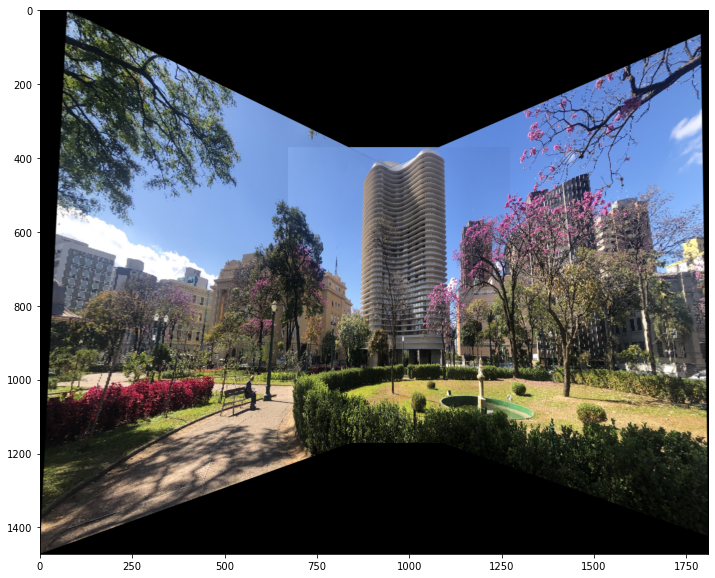

In [6]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_brief, 'average')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Percebe-se claramente uma diferença entre iluminação nas cores do céu da imagem, sendo possível identificar claramente um retângulo que separa as três imagens. Nota-se ainda que essa discrepância só é notada facilmente ao se olhar para as cores do céu, seguindo o traço do retângulo não é possível ver o mesmo comportamento para o cenário de natureza e urbano, o que mostra que esse método pode ser eficaz para cenas com frequências altas.
### Feathering

A seguir, fez-se o mesmo para os descritores BRIEF, porém com uso de *feathering* para o *blending*:

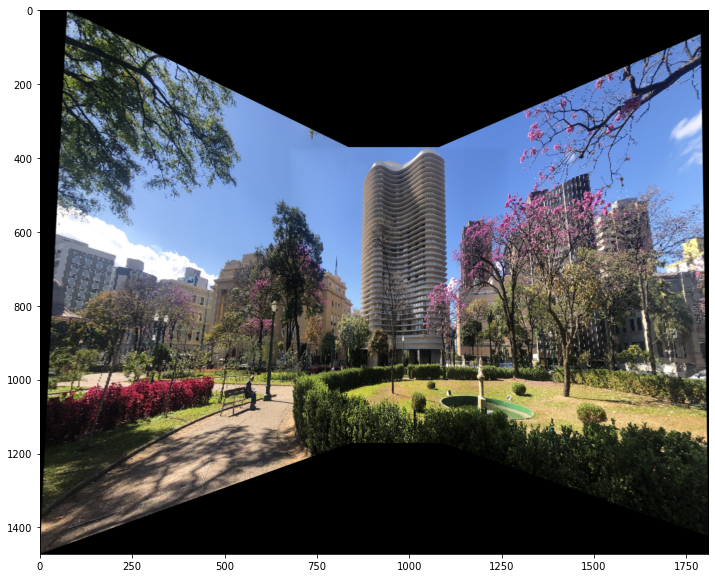

In [7]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_brief, 'feathering')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Nota-se que o retângulo antes facilmente notável, agora não é tão direto assim. Para a junção à direita, não se nota divergência de iluminação, porém para a junção à esquerda ainda é possível notar uma diferença entre as cores do céu. De toda forma, esse tipo de *blending* se mostrou muito mais eficiente.

## SIFT descriptors
### Straight Average Blending

Fez-se agora o mesmo procedimento utilizando os descritores SIFT, com uso do *blending* de média:

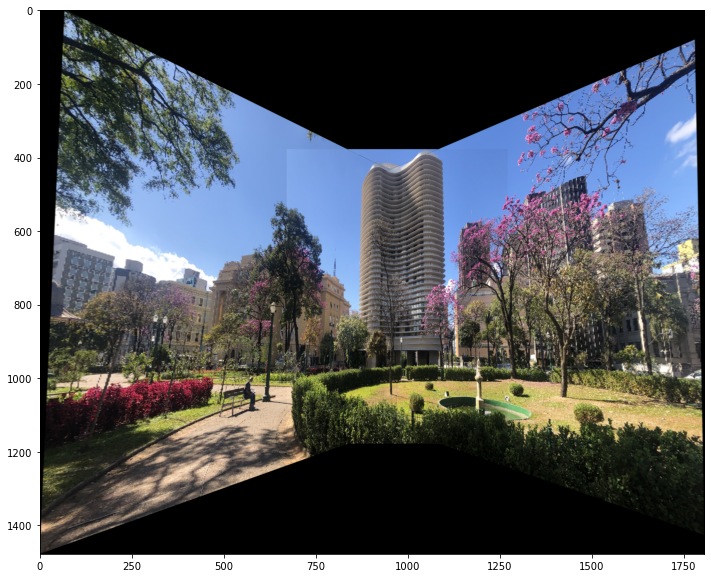

In [8]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_sift, 'average')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Para os descritores SIFT, obteve-se o mesmo comportamento obtido para o BRIEF com uso do método de média. Os resultados obtidos são muito parecidos e não é possível notar diferença entre os mosaicos obtidos pelos dois métodos.
### Feathering

A seguir, foi realizado o mesmo procedimento utilizando os descritores SIFT com *feathering*:

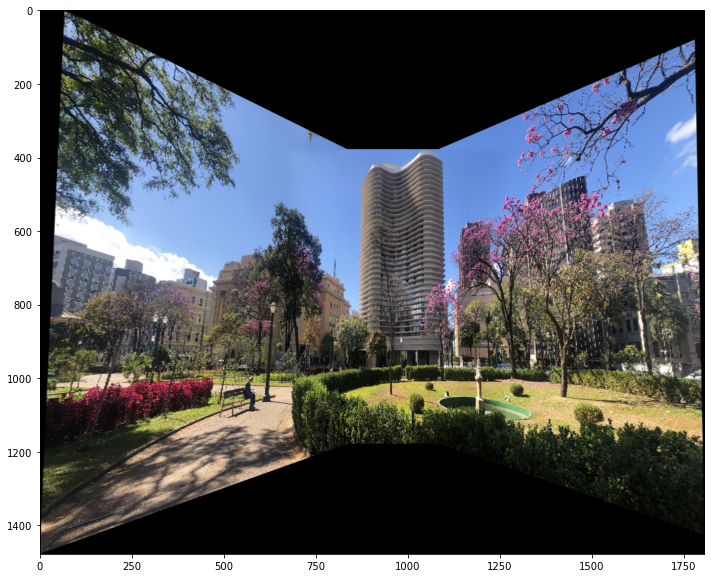

In [9]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_sift, 'feathering')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Novamente, o resultado obtido é muito parecido com o obtido via BRIEF, tendo os mesmos problemas de *blending*, mas ainda não é possível notar diferença entre o uso de ambos os descritores.
# Image Set 2

Com auxílio da função criada `get_BRIEFnSIFT_homographies`, obtém-se as imagens do conjunto do *set* 2, que podem ser mostradas abaixo ao se remover os comentários (adicionados para reduzir o tamanho do arquivo), além das tuplas com todas as homografias `H_brief` e `H_sift`:

In [10]:
imgs, H_brief, H_sift = get_BRIEFnSIFT_homographies(2, 3)

In [12]:
#_, axs = plt.subplots(1, 3, figsize=(12, 12))
#axs = axs.flatten()
#for img, ax in zip(imgs, axs):
#    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#plt.show()

## BRIEF descriptors
### Straight Average Blending

Primeiramente, tomou-se o mosaico resultante via descritores BRIEF e *blending* de média:

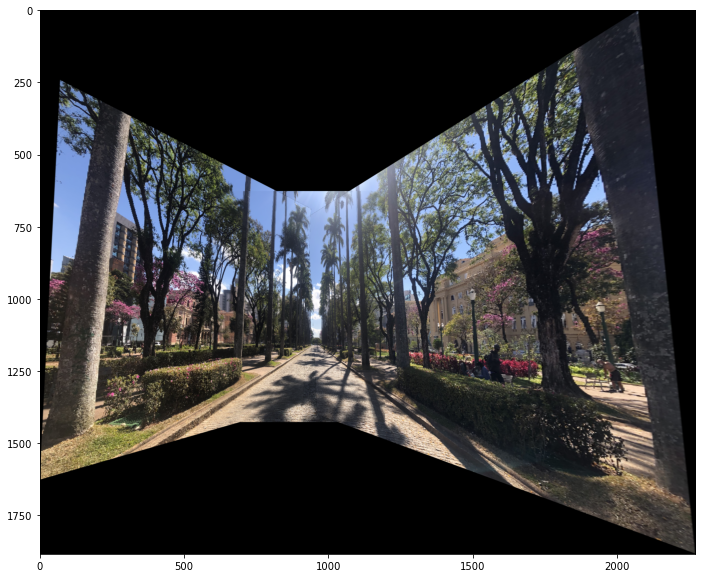

In [11]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_brief, 'average')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Para esse conjunto de imagens, os problemas com esse método de *blending* são mais difíceis de notar. Ao se avaliar o centro e topo da imagem final obtida, percebe-se as linhas que definem os limites das imagens projetadas. Nota-se também que as sombras das palmeiras mais abaixo da imagem têm um contraste diferente no meio ao se comparar com as laterais da mesma sombra.

Em suma, o método de média foi mais efetivo para esse conjunto de imagens e especula-se que esse motivo seja devido às frequências mais altas desse conjunto.
### Feathering
Em seguida, tomou-se o resultado para os descritores BRIEF com utilização de *Feathering*:

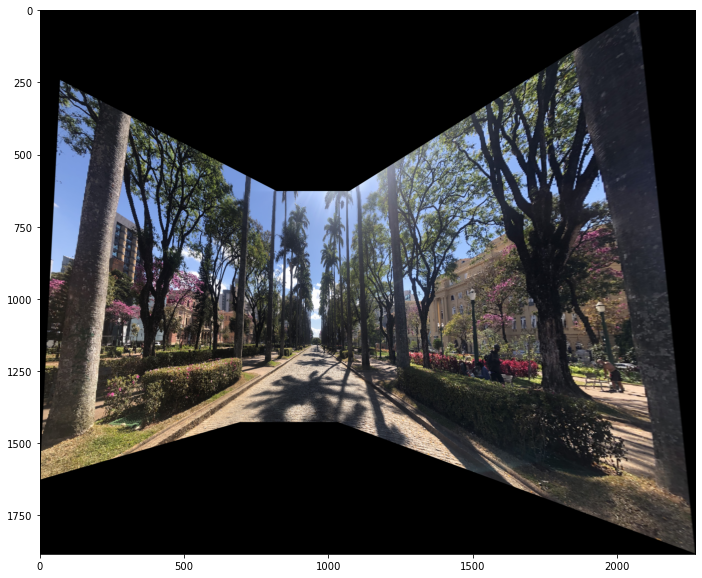

In [12]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_brief, 'feathering')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Com o uso do *feathering*, não se notou problemas quanto ao *blending*, assim o mosaico gerado não apresenta falhas, ou ao menos não são fáceis de notar.
## SIFT descriptors
### Straight Average Blending

Fez-se em seguida o teste para os descritores SIFT, primeiramente utilizando o método de média:

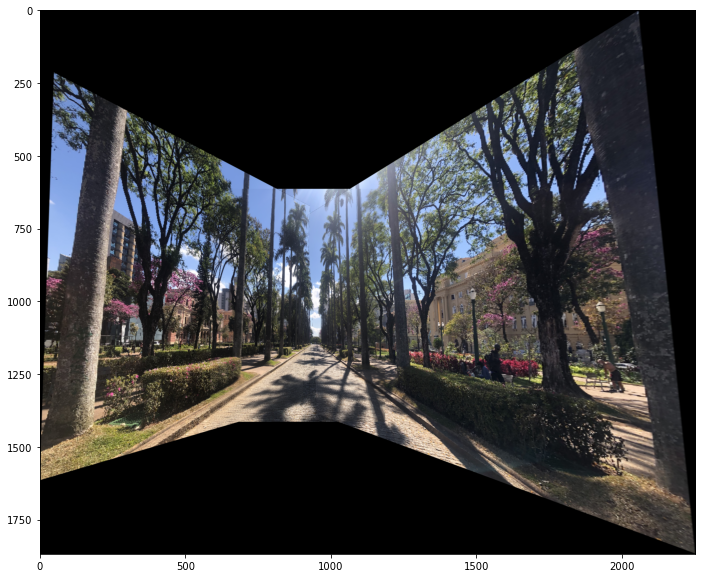

In [13]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_sift, 'average')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Obteve-se os mesmos problemas relatados para os descritores BRIEF utilizando o mesmo *blending*. Além disso, não se nota diferenças entre os resultados entre ambos os descritores.
### Feathering
Para os descritores SIFT utilizando o *feathering*, obteve-se o mosaico:

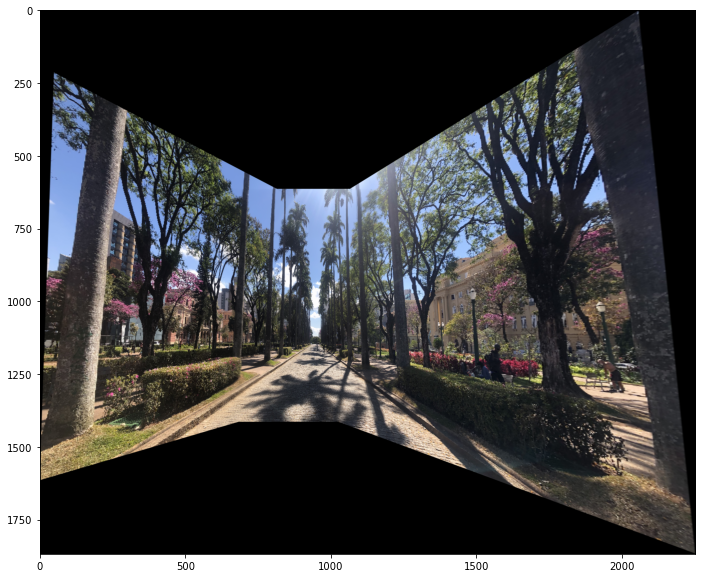

In [14]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_sift, 'feathering')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Assim como o obtido pelos descritores BRIEF, o mosaico obtido não apresenta falhas, pelo menos não fáceis de notar. Assim, novamente, não se notou diferença entre os resultados obtidos por ambos os descritores.
# Image Set 3
> NOTA: As imagens enviadas não correspondem às originais, sua qualidade foi reduzida porque o Moodle só aceita arquivos de no máximo 20MB e as imagens originais ocupavam 17MB.

Com auxílio da função criada `get_BRIEFnSIFT_homographies`, obtém-se as imagens do conjunto do *set* 3, gerado pelo aluno, que podem ser mostradas abaixo ao se remover os comentários (adicionados para reduzir o tamanho do arquivo), além das tuplas com todas as homografias `H_brief` e `H_sift`:

In [15]:
imgs, H_brief, H_sift = get_BRIEFnSIFT_homographies(3, 3)

In [18]:
#_, axs = plt.subplots(1, 3, figsize=(12, 12))
#axs = axs.flatten()
#for img, ax in zip(imgs, axs):
#    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#plt.show()

## BRIEF descriptors
### Straight Average Blending

O mosaico obtido para esse conjunto de imagens, via descritores BRIEF e *Straight average* foi:

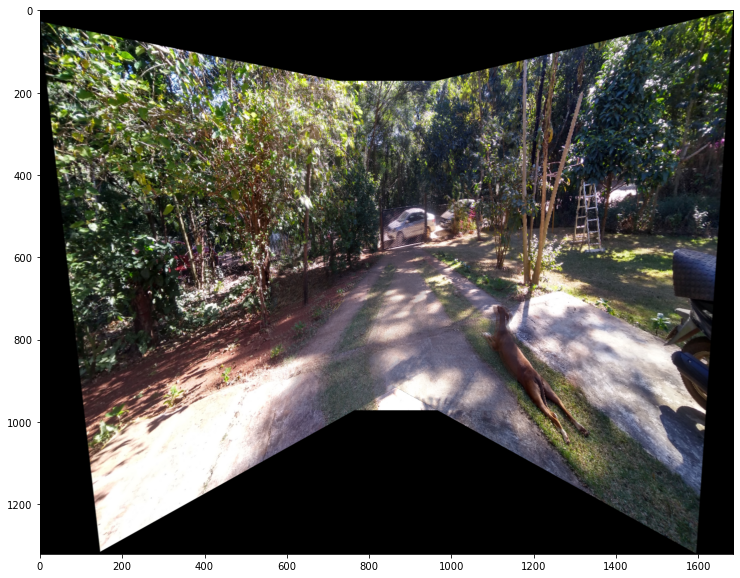

In [16]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_brief, 'average')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Para esse conjunto de imagens, nota-se um certo *blur* na imagem, especula-se que isso se deva às variações de iluminação e contraste. Essa discrepância é muito mais fácil de se notar ao se analisar o cachorro (Thor) que tem um borrão nítido em sua cabeça. Assim, diferentemente dos conjuntos anteriores, esse método de *blending* teve um comportamento muito ruim e notavelmente "falso".
### Feathering

Aplicou-se então com base nos descritores BRIEF, o método *feathering*:

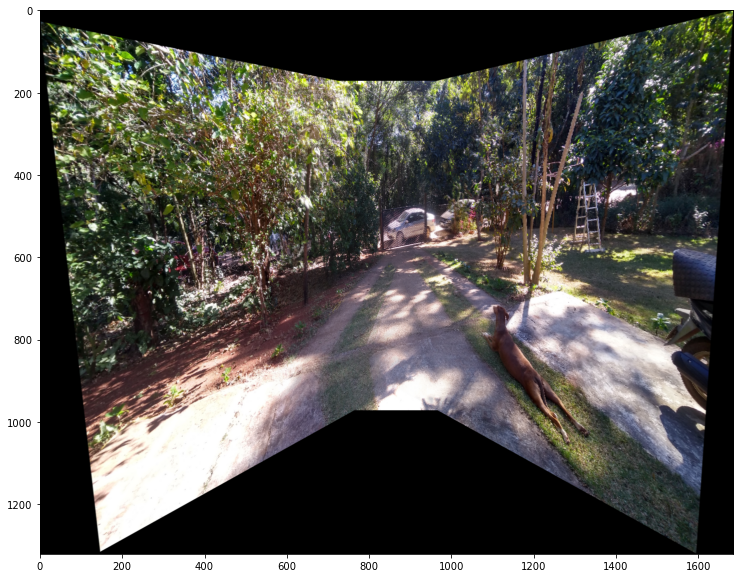

In [17]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_brief, 'feathering')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Ao se analisar o resultado obtido com base no Thor, percebe-se que o resultado obtido é muito mais satisfatório, sua cabeça agora está normal e somente apresenta um borrão no seu pescoço. Além disso, é difícil notar, com exceção da análise feita, que são três imagens unidas
## SIFT descriptors
### Straight Average Blending

Para os descritores SIFT com uso do *blending* de média, obteve-se:

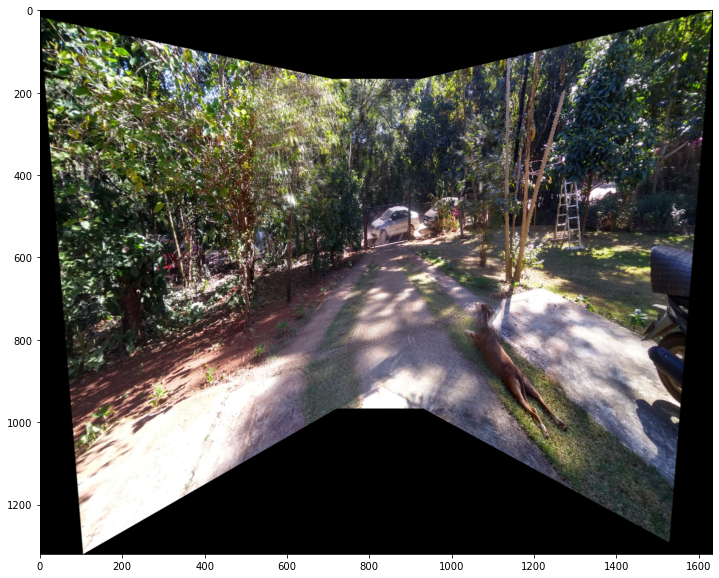

In [18]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_sift, 'average')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

Com o uso dos descritores SIFT, obteve-se um resultado pior do que o obtido pelo BRIEF. Novamente, utilizando o Thor como parâmetro de análise, sua cabeça está muito mais borrada nesse resultado do que o obtido pelo BRIEF, aparentando certo movimento (ressalta-se que ele não se moveu entre as fotos). Não era esperado esse resultado inferior para os descritores SIFT, assim, pode-se apenas especular que ou BRIEF, por ser mais simples, ignora a tridimensionalidade da cabeça do Thor, fazendo uma projeção mais correta, ou que o uso da métrica euclidiana para o *matching* dos descritores SIFT não tenha sido a melhor escolha para esse conjunto.
### Feathering
O resultado dos descritores SIFT com uso de *feathering* foi:

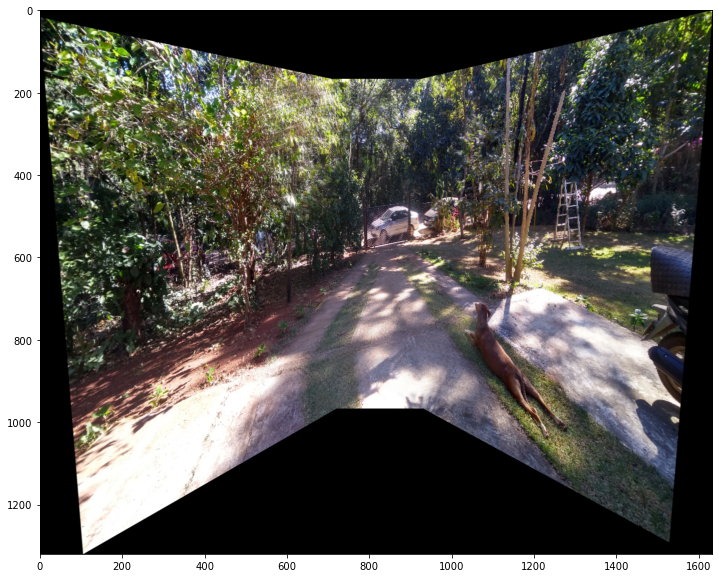

In [19]:
result = warpImages_multi(imgs[1], (imgs[0], imgs[2]), H_sift, 'feathering')
result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
plt.figure(figsize = (15,10))
plt.imshow(result)
plt.show()

O resultado com *feathering* foi superior ao obtido por média, porém da mesma forma, o resultado foi inferior ao BRIEF. Percebe-se que há um borrão tanto no pescoço quanto na cabeça do Thor, novamente pode-se apenas especular os motivos já apresentados para esse comportamento.


Com os resultados apresentados, observou-se que o método de *blending* por média pode ser bastante eficaz para alguns tipos de imagem, que foi especulado como imagens de alta frequência, do contrário o *feathering* é mais aconselhável, tendo ainda presença de alguns artefatos. A diferença entre os resultados obtidos por BRIEF e SIFT não foi notada para os conjuntos 1 e 2 de imagens, porém a diferença foi clara para o terceiro conjunto, graças à presença do Thor, dessa forma, conclui-se, mesmo havendo problemas, que o mosaico obtido por BRIEF é melhor para imagens que contenham uma fração pequena de seres/objetos com tridimensionalidade bem definida, entretanto, reitera-se que isso apenas é uma especulação, fundamentada por experimentos simples e que talvez não seja verdade ao se utilizar outra métrica para o *matching* de descritores SIFT.